<a href="https://colab.research.google.com/github/Adrianonsare/Covid_19Analysis/blob/main/Covid_19_Latest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

REF:https://towardsdatascience.com/covid-19-data-processing-58aaa3663f6

In [34]:
# #Wget is necessary to download data
# !pip install wget

In [35]:
# !pip install streamlit
# !pip install geopandas

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.core.display import display, HTML
import os
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd
import requests


In [37]:
# url of the raw csv dataset
urls = [
    'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv',
    'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv',
    'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
]


In [38]:
confirmed= pd.read_csv(urls[0])
deaths= pd.read_csv(urls[1])
recovered= pd.read_csv(urls[2])

In [39]:
confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,12/3/21,12/4/21,12/5/21,12/6/21,12/7/21,12/8/21,12/9/21,12/10/21,12/11/21,12/12/21,12/13/21,12/14/21,12/15/21,12/16/21,12/17/21,12/18/21,12/19/21,12/20/21,12/21/21,12/22/21,12/23/21,12/24/21,12/25/21,12/26/21,12/27/21,12/28/21,12/29/21,12/30/21,12/31/21,1/1/22,1/2/22,1/3/22,1/4/22,1/5/22,1/6/22,1/7/22,1/8/22,1/9/22,1/10/22,1/11/22
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,5,5,...,157412,157431,157454,157499,157508,157542,157585,157603,157611,157633,157648,157660,157665,157725,157734,157745,157787,157797,157816,157841,157878,157887,157895,157951,157967,157998,158037,158056,158084,158107,158189,158183,158205,158245,158275,158300,158309,158381,158394,158471
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,201045,201402,201730,201902,202295,202641,202863,203215,203524,203787,203925,204301,204627,204928,205224,205549,205777,205897,206273,206616,206935,207221,207542,207709,207709,208352,208899,208899,210224,210224,210885,210885,212021,212021,213257,214905,214905,219694,220487,222664
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,211112,211297,211469,211662,211859,212047,212224,212434,212652,212848,213058,213288,213533,213745,214044,214330,214592,214835,215145,215430,215723,216098,216376,216637,216930,217265,217647,218037,218432,218818,219159,219532,219953,220415,220825,221316,221742,222157,222639,223196
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,18010,18010,18010,18631,18815,18815,19272,19440,19440,19440,19440,20136,20136,20549,20549,20549,20549,21062,21062,21372,21571,21730,21730,21730,22332,22540,22823,23122,23740,23740,23740,24502,24802,25289,25289,26408,26408,26408,27983,28542
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,65223,65244,65259,65259,65301,65332,65346,65371,65397,65404,65404,65431,65565,65648,65760,65868,65938,66086,66566,67199,68362,70221,71142,71752,71752,76787,78475,79871,81593,82398,82920,83764,84666,86636,87625,88775,89251,89718,90316,91148


In [40]:
#Transpose Date column names to values, with 'Province/State', 'Country/Region', 'Lat', 'Long' as id vars

dates = confirmed.columns[4:]
confirmed_melt = confirmed.melt(
    id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
    value_vars=dates, 
    var_name='Date', 
    value_name='Confirmed'
)
deaths_melt = deaths.melt(
    id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
    value_vars=dates, 
    var_name='Date', 
    value_name='Deaths'
)
recovered_melt = recovered.melt(
    id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
    value_vars=dates, 
    var_name='Date', 
    value_name='Recovered'
)

In [41]:
# Merging confirmed_melt and deaths_melt

df1 = confirmed_melt.merge(
  right=deaths_melt, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']
)
# Merging full_table and recovered_df_long
covid = df1.merge(
  right=recovered_melt, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']
)

In [42]:
#Read in Country List to allow inclusion of regions
CountryList=pd.read_csv('https://raw.githubusercontent.com/Adrianonsare/Covid_19Analysis/main/RegionalClassifications.csv')
CountryList=CountryList.rename(columns={'Country Name':'Country/Region'})

In [43]:
CountryList.columns

Index(['Country/Region', 'Iso3 code', 'UN Regions', 'UN sub-region',
       'UNICEF region 1', 'WHO Region 2',
       'World Bank Income Group Combined 13',
       'World Bank Income Group Combined 23', 'World Bank Regions',
       'MDG Region', 'SDG Region', 'LDCs', 'Developed/Developing'],
      dtype='object')

In [44]:
covid=covid.merge(right=CountryList[['Country/Region','UN Regions', 'UN sub-region']],
how='left',
on='Country/Region'
)


In [45]:
#The cruise ship data was wrongly placed in columns of country and province, it's needful to correct that
ship_rows = covid['Province/State'].str.contains('Grand Princess') | covid['Province/State'].str.contains('Diamond Princess') | covid['Country/Region'].str.contains('Diamond Princess') | covid['Country/Region'].str.contains('MS Zaandam')
ship_data = covid[ship_rows]

covid = covid[~(ship_rows)]

In [46]:
covid.tail()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,UN Regions,UN sub-region
201875,NaN,Vietnam,14.058324,108.277199,1/11/22,1930428,34787,0.0,NaN,NaN
201876,NaN,West Bank and Gaza,31.952200,35.233200,1/11/22,473302,4993,0.0,Asia,Western Asia
201877,NaN,Yemen,15.552727,48.516388,1/11/22,10208,1987,0.0,Asia,Western Asia
201878,NaN,Zambia,-13.133897,27.849332,1/11/22,287110,3825,0.0,Africa,Eastern Africa
201879,NaN,Zimbabwe,-19.015438,29.154857,1/11/22,223000,5180,0.0,Africa,Eastern Africa


In [47]:
covid.dtypes

Province/State     object
Country/Region     object
Lat               float64
Long              float64
Date               object
Confirmed           int64
Deaths              int64
Recovered         float64
UN Regions         object
UN sub-region      object
dtype: object

In [48]:
#change Date column to Datetime
covid['Date']=pd.to_datetime(covid['Date'])
covid.set_index(["Date"],inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
#find missing values
covid.isna().sum()

Province/State    137711
Country/Region         0
Lat                 1442
Long                1442
Confirmed              0
Deaths                 0
Recovered          13699
UN Regions         29561
UN sub-region      29561
dtype: int64

In [50]:
#Replace Na values in recovered column with "0" since some countries are yet to post recoveries
covid['Recovered'] = covid['Recovered'].fillna(0)

In [51]:
# Active Case = confirmed - deaths - recovered
covid['Active_Cases'] = covid['Confirmed'] - covid['Deaths'] - covid['Recovered']

In [52]:
covid.head(5)

,Province/State,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,UN Regions,UN sub-region,Active_Cases
Date,,,,,,,,,,
2020-01-22,NaN,Afghanistan,33.93911,67.709953,0,0,0.0,Asia,Southern Asia,0.0
2020-01-22,NaN,Albania,41.15330,20.168300,0,0,0.0,Europe,Southern Europe,0.0
2020-01-22,NaN,Algeria,28.03390,1.659600,0,0,0.0,Africa,Northern Africa,0.0
2020-01-22,NaN,Andorra,42.50630,1.521800,0,0,0.0,Europe,Southern Europe,0.0
2020-01-22,NaN,Angola,-11.20270,17.873900,0,0,0.0,Africa,Middle Africa,0.0


### Covid Africa

In [ ]:
len(covid)

### EDA

In [53]:
#Data is Time Series
# Groupby to find cumulative figures
covid_19 = covid.groupby(['Date', 'Country/Region','Lat','Long'])['Confirmed', 'Deaths', 'Recovered', 'Active_Cases'].sum().reset_index()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [ ]:
# covid_19

In [54]:
#Global Heatmap
import plotly.express as px
fig = px.density_mapbox(covid_19, lat='Lat', lon='Long', z='Confirmed', radius=10,
                        center=dict(lat=0, lon=34), zoom=1.05,
                        mapbox_style="stamen-terrain")
fig.show()

In [55]:
#Global Heatmap
import plotly.express as px
fig = px.density_mapbox(covid_19, lat='Lat', lon='Long', z='Confirmed', radius=10,
                        center=dict(lat=0, lon=34), zoom=1.05,
                        mapbox_style="satellite")
fig.show()

In [56]:
# new cases 
temp = covid.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Country/Region'] != temp['Country/Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

# renaming columns
temp.columns = ['Country/Region', 'Date', 'New cases', 'New deaths', 'New recovered']

# merging new values
covid_19 = pd.merge(covid_19, temp, on=['Country/Region', 'Date'])
# filling na with 0
covid_19 = covid_19.fillna(0)
# fixing data types
cols = ['New cases', 'New deaths', 'New recovered']
covid_19[cols] = covid_19[cols].astype('int')
# 
covid_19['New cases'] = covid_19['New cases'].apply(lambda x: 0 if x<0 else x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [ ]:
covid_19.head(5)

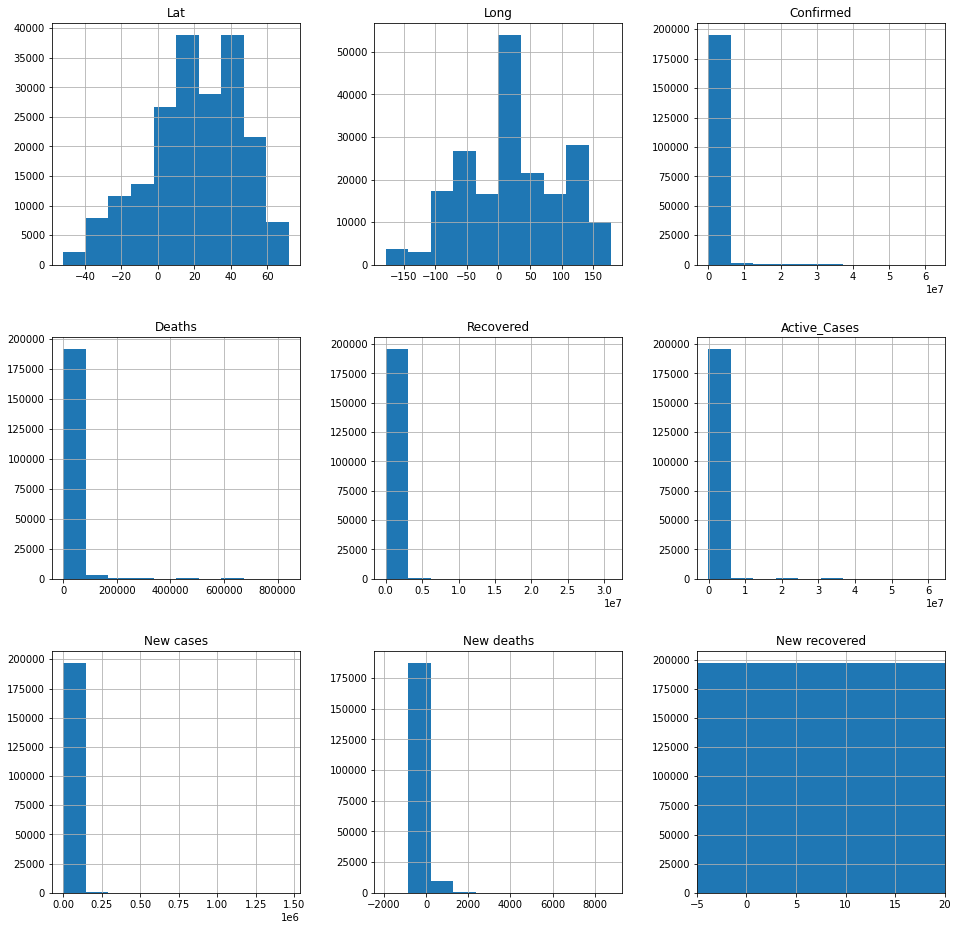

In [57]:
pd.DataFrame.hist(covid_19, figsize=(16,16))
plt.xlim([-5, 20]) 
plt.show()

In [ ]:
# sns.pairplot(covid_19)

### Basic Visualisation

In [58]:
df_group=covid_19.groupby('Country/Region')["Confirmed"].max().reset_index()


In [59]:
country_sort=df_group.sort_values(by="Confirmed",ascending=False)

In [60]:
country_sort[:8]

,Country/Region,Confirmed
180,US,62308472
78,India,35875790
23,Brazil,22636359
184,United Kingdom,14732594
61,France,12322734
142,Russia,10503101
179,Turkey,10119884
84,Italy,7774863


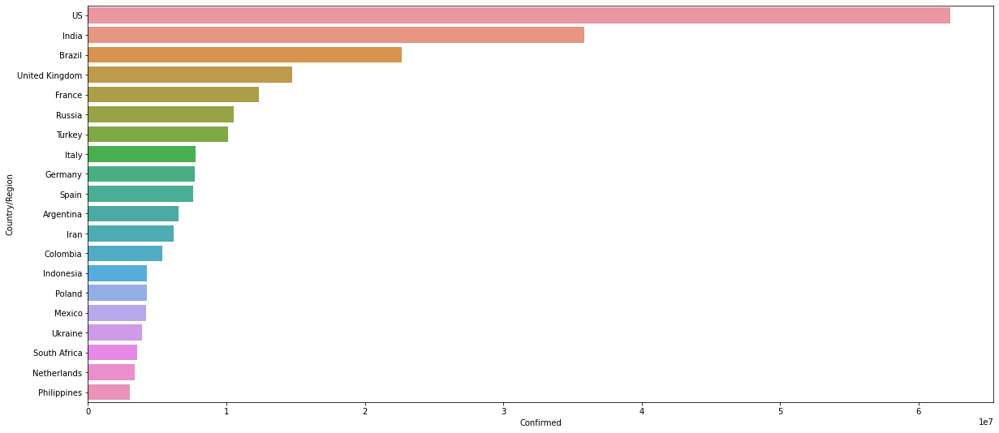

In [61]:
plt.figure(figsize=(20,9))
sns.barplot(data=country_sort[:20],y="Country/Region",x="Confirmed",orient="h")

plt.show()

In [62]:
fig=px.scatter(country_sort[:25],x="Country/Region",y="Confirmed",size="Confirmed",color="Country/Region",
               hover_name="Country/Region",size_max=60)
fig.update_layout(title="Top 20 Active Cases Per Country",
    xaxis_title="Country",
    yaxis_title="No of Confirmed Cases",
    font=dict(
        family="Courier New, monospace",
        size=15,
        color="#7f7f7f"))
                  
fig.show()

In [63]:
covid_19.iloc[:,0:4]

,Date,Country/Region,Lat,Long
0,2020-01-22,Afghanistan,33.939110,67.709953
1,2020-01-22,Albania,41.153300,20.168300
2,2020-01-22,Algeria,28.033900,1.659600
3,2020-01-22,Andorra,42.506300,1.521800
4,2020-01-22,Angola,-11.202700,17.873900
...,...,...,...,...
197549,2022-01-11,Vietnam,14.058324,108.277199
197550,2022-01-11,West Bank and Gaza,31.952200,35.233200
197551,2022-01-11,Yemen,15.552727,48.516388
197552,2022-01-11,Zambia,-13.133897,27.849332


In [64]:
df_conf=covid_19.iloc[:,0:3]#.reset_index()

df_death=covid_19.iloc[:,0:4]#.reset_index()
# df_death=covid_19.iloc[:,[0:2,3]]
# df_death=covid_19[["Country/Region","Deaths"]]
df_death.drop(columns=["Confirmed"],inplace=True)
df_conf["country"]=df_conf["Countfry/Region"]

df_death["country"]=df_conf["Country/Region"]
df_conf.drop(columns=["Country/Region"],inplace=True)
df_death.drop(columns=["Country/Region"],inplace=True)

df_conf=df_conf[["Date","country","Confirmed"]]
df_death=df_death[["Date","country","Deaths"]]



df_death.head()

KeyError: ignored

In [ ]:
df_conf.head(4)

In [65]:
#Altair is an awesome visualisation lib
!pip install altair

In [67]:
import altair as alt
full_grouped = pd.read_csv('COVID-19-time-series-clean-complete.csv', parse_dates=['Date'])
ke = full_grouped[full_grouped['Country/Region'] == 'Kenya']

FileNotFoundError: ignored

In [68]:
base = alt.Chart(ke).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=600
)

NameError: ignored

In [ ]:
red=alt.value("#f54242")
base.encode(y='Confirmed').properties(title="Total Confirmed")|base.encode(y='Deaths',color=red).properties(title="Total Deaths")


In [ ]:
red=alt.value("#f54242")
base.encode(y='New cases').properties(title="Daily New Cases")|base.encode(y='New deaths',color=red).properties(title="Daily New Deaths")


In [ ]:
red=alt.value("#f54242")
base.encode(y='New recovered').properties(title="Daily New Recoveries")

In [ ]:
#Using Altair plot for East African Cases
full_grouped = pd.read_csv('COVID-19-time-series-clean-complete.csv', parse_dates=['Date'])
countries = ['Kenya', 'Ethiopia', 'Uganda', 'Tanzania','Rwanda', 'Burundi']#'South Africa']
selected_countries = full_grouped[full_grouped['Country/Region'].isin(countries)]

In [ ]:
full_grouped .head(5)

In [ ]:
alt.Chart(selected_countries).mark_circle().encode(
    x='monthdate(Date):O',
    y='Country/Region',
    color='Country/Region',
    size=alt.Size('New cases:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Daily new cases')
    ) 
).properties(
    width=800,
    height=400,
    title='East Africa Daily New Cases'
)